# 生成对抗网络(Generative Adversarial Networks, GAN)

## 1.原理和结构
GAN 是一种深度神经网络架构，由生成器(generator)和判别器(discriminator)组成。

生成器产生假(Fake)数据，试图骗过判别器；判别器对生成的数据进行真伪鉴别，试图正确识别所有假数据。

在训练迭代过程中，两个网络持续进化和对抗，直到达到纳什均衡，判别网络无法再分辨真假数据。

* G, 接受一个随机的噪声 z, 通过这个噪声生成图片，记作 G(z)。
* D, 判别一张图片是不是真实的。输入参数是 x, 代表一张图片，输出 D(x) 是真实图片的概率。

## 2.算法流程
能否正确区分生成的图片和真实的图片将作为判别器的损失，而能否生成近似真实的图片并使得判别器将生成的图片判定为真将作为生成器的损失。

生成器的损失是通过判别器的输出来计算的；而判别器的输出是一个概率值，可以通过交叉熵计算。

公式：$$ \min_G \max_D V(D, G) = \mathbb{E}_{x \sim p_{data}(x)}[log D(x)] + \mathbb{E}_{z \sim p_{z}(z)}[log (1 - D(G(z)))] $$

其中，$p_{data}(x)$ 是真实数据分布，$p_{z}(z)$ 是从标准正态分布中采样的噪声分布。

公式中 $ \min_G \max_D V(D, G) $ 表示：

* 从 D 的角度，希望最大化 $ V(D, G) $
* 从 G 的角度，希望最小化 $ V(D, G) $


## 3.基础 GAN 实现

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets, transforms

### 3.1 数据准备

In [3]:
# 归一化(因为生成模型会用 tanh 进行激活，所以数据要在 -1 到 1 之间)
transform = transforms.Compose([
    transforms.ToTensor(),      # 作用：① 将图像转化为tensor( channel x width x height )，② 归一化到[0,1]
    transforms.Normalize(0.5, 0.5)      # 均值, 方差；减去均值，除以方差，使得数据分布在[-1,1]之间
])
train_dataset = datasets.MNIST(root='./data', train=True, download=True, transform=transform)
dataloader = DataLoader(train_dataset, batch_size=64, shuffle=True)

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [01:28<00:00, 111896.12it/s]


Extracting ./data\MNIST\raw\train-images-idx3-ubyte.gz to ./data\MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 59765.58it/s]


Extracting ./data\MNIST\raw\train-labels-idx1-ubyte.gz to ./data\MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:14<00:00, 113946.01it/s]


Extracting ./data\MNIST\raw\t10k-images-idx3-ubyte.gz to ./data\MNIST\raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 297571.52it/s]

Extracting ./data\MNIST\raw\t10k-labels-idx1-ubyte.gz to ./data\MNIST\raw



In [4]:
images, _ = next(iter(dataloader))
print(images.shape)

torch.Size([64, 1, 28, 28])


### 3.2 生成器的定义

In [5]:
# 输入：长度为 100 的噪声向量(正态分布随机数)
# 输出：(1, 28, 28)的图片
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(100, 256),    # Linear1: 100 --> 256
            nn.ReLU(),
            nn.Linear(256, 512),    # Linear2: 256 --> 512
            nn.ReLU(),
            nn.Linear(512, 28 * 28),# Linear3: 512 --> 28 * 28
            nn.Tanh()
        )
        
    def forward(self, x):
        """
        :param x: 长度为 100 的噪声向量
        :return: 输出的图片
        """
        image = self.main(x)
        image = image.view(-1, 28, 28, 1)   # 转换为 (batch_size, 28, 28, 1) ；-1 表示 batch_size 由上层自动计算
        return image

### 3.3 判别器的定义

In [6]:
# 输入：(1, 28, 28)的图片
# 输出：二分类的概率值(使用sigmoid激活函数) ==> 使用 BCELoss 作为损失函数计算交叉熵损失
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.main = nn.Sequential(
            nn.Linear(28 * 28, 512),# Linear1: 28 * 28 --> 512
            nn.LeakyReLU(),
            nn.Linear(512, 256),    # Linear2: 512 --> 256
            nn.LeakyReLU(),
            nn.Linear(256, 1),      # Linear3: 256 --> 1
            nn.Sigmoid()
        )
        
    def forward(self, x):
        x = x.view(-1, 28 * 28)
        x = self.main(x)
        return x

### 3.4 初始化模型、优化器和损失计算函数

In [7]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
# 定义模型
generator = Generator().to(device)
discriminator = Discriminator().to(device)
# 定义优化器
optimizer_G = torch.optim.Adam(generator.parameters(), lr=0.0001)
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=0.0001)
# 定义损失函数
loss_fn = nn.BCELoss()

### 3.5 绘图函数

In [13]:
def plot_generator_image(model, test_input):
    prediction = np.squeeze(model(test_input).detach().cpu().numpy())
    figure = plt.figure(figsize=(4, 4))
    for i in range(16):
        plt.subplot(4, 4, i + 1)
        plt.imshow((prediction[i] + 1) / 2)
        plt.axis('off')
    plt.show()

### 3.6 训练过程

Epoch 1/100, D_loss: 0.2389, G_loss: 3.1479


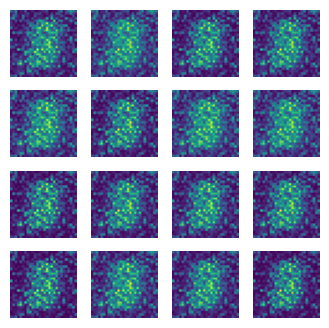

Epoch 2/100, D_loss: 0.1045, G_loss: 3.9066


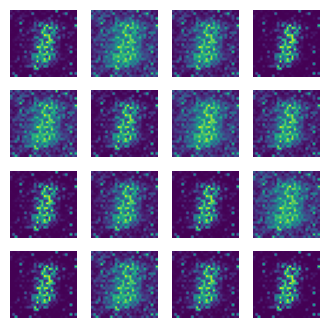

Epoch 3/100, D_loss: 0.1178, G_loss: 4.3378


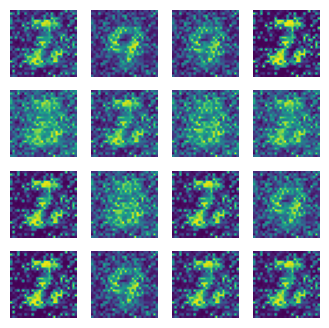

Epoch 4/100, D_loss: 0.1412, G_loss: 4.8976


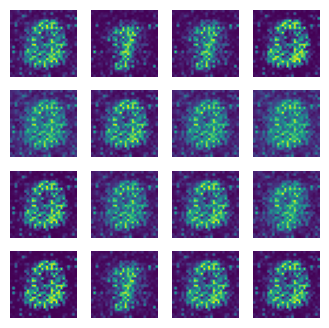

Epoch 5/100, D_loss: 0.1217, G_loss: 4.7145


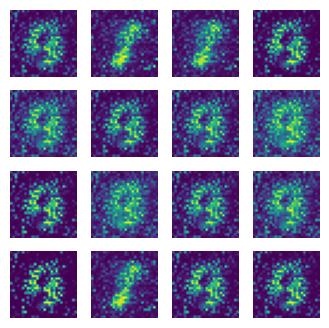

Epoch 6/100, D_loss: 0.1385, G_loss: 5.4642


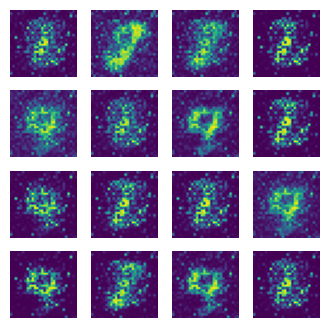

Epoch 7/100, D_loss: 0.1386, G_loss: 5.0715


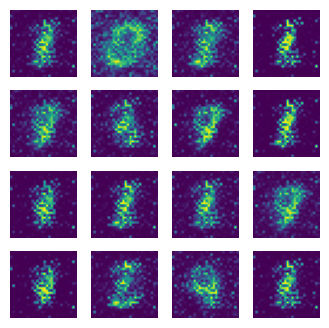

Epoch 8/100, D_loss: 0.1170, G_loss: 5.3109


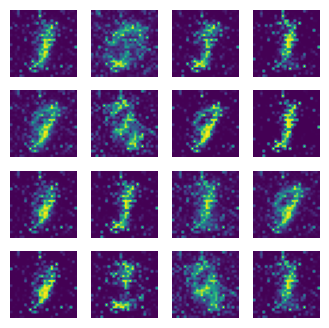

Epoch 9/100, D_loss: 0.1204, G_loss: 5.6997


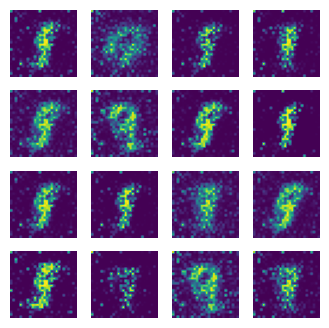

Epoch 10/100, D_loss: 0.1313, G_loss: 5.6428


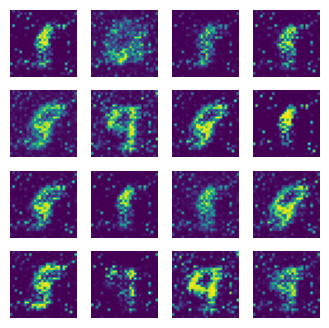

Epoch 11/100, D_loss: 0.1180, G_loss: 6.0754


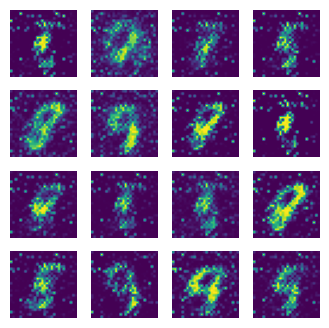

Epoch 12/100, D_loss: 0.1064, G_loss: 6.2134


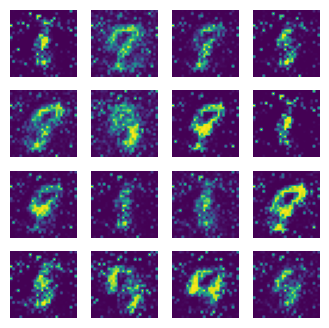

Epoch 13/100, D_loss: 0.1513, G_loss: 6.0910


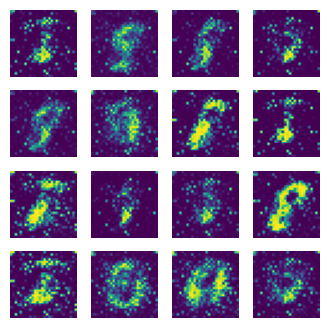

Epoch 14/100, D_loss: 0.1237, G_loss: 6.1488


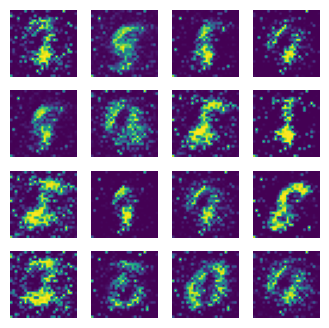

Epoch 15/100, D_loss: 0.1137, G_loss: 6.4053


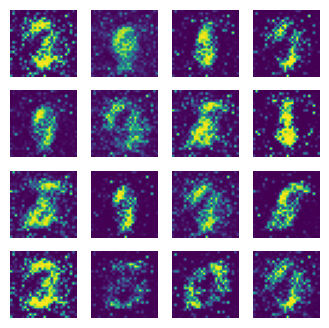

Epoch 16/100, D_loss: 0.1621, G_loss: 5.9408


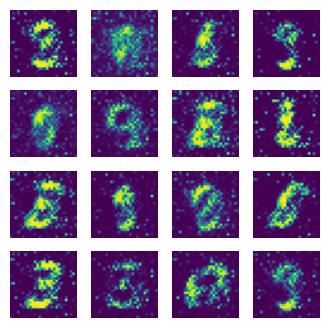

Epoch 17/100, D_loss: 0.1579, G_loss: 5.7545


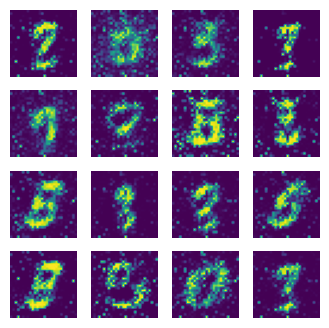

Epoch 18/100, D_loss: 0.1756, G_loss: 5.7723


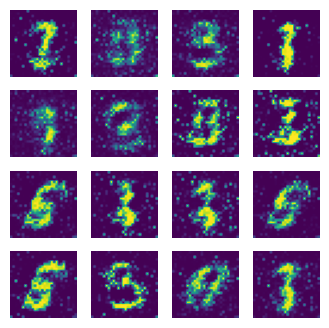

Epoch 19/100, D_loss: 0.1722, G_loss: 5.7387


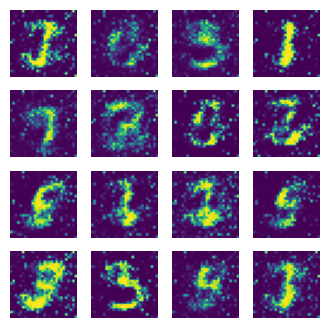

Epoch 20/100, D_loss: 0.1994, G_loss: 5.2221


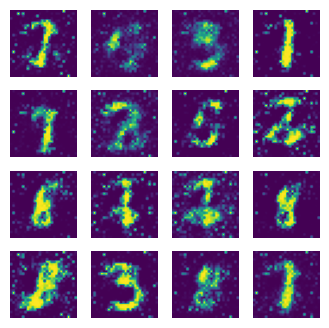

Epoch 21/100, D_loss: 0.2404, G_loss: 4.4883


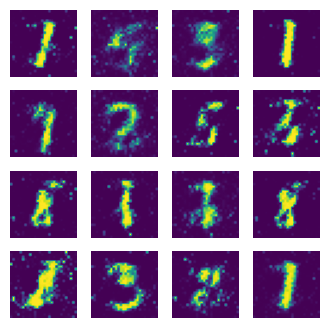

Epoch 22/100, D_loss: 0.2648, G_loss: 4.1366


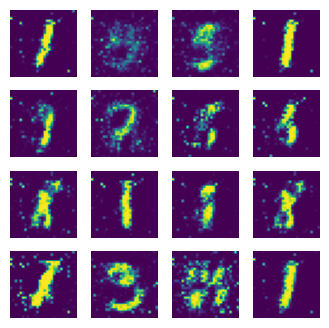

Epoch 23/100, D_loss: 0.2940, G_loss: 3.9817


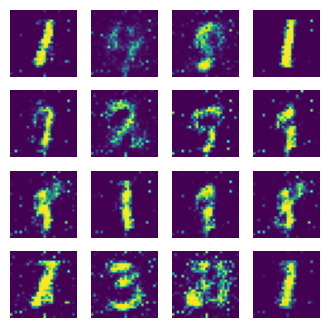

Epoch 24/100, D_loss: 0.2870, G_loss: 4.0987


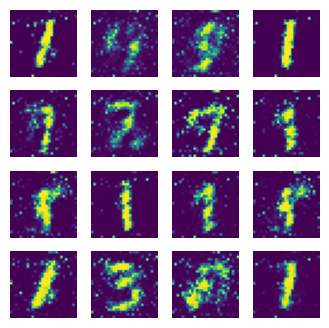

Epoch 25/100, D_loss: 0.1858, G_loss: 5.6705


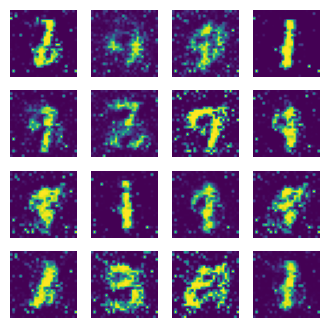

Epoch 26/100, D_loss: 0.2742, G_loss: 4.1716


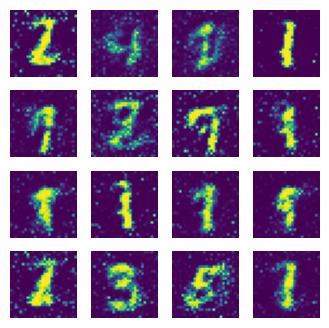

Epoch 27/100, D_loss: 0.3421, G_loss: 3.5412


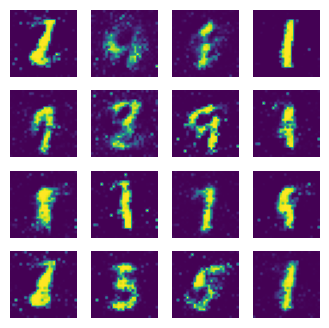

Epoch 28/100, D_loss: 0.3538, G_loss: 3.3129


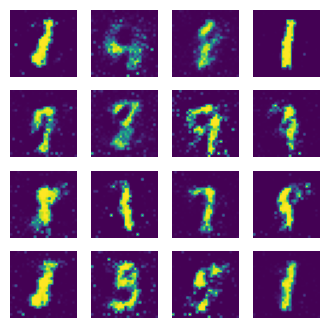

Epoch 29/100, D_loss: 0.3849, G_loss: 3.2121


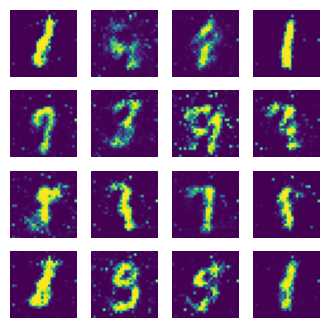

Epoch 30/100, D_loss: 0.3903, G_loss: 3.0622


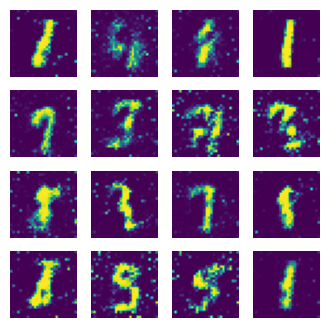

Epoch 31/100, D_loss: 0.3782, G_loss: 3.2168


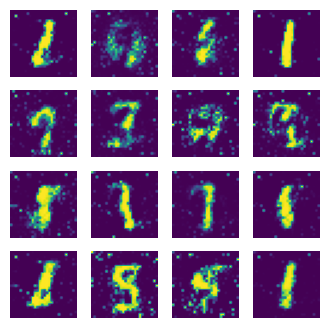

Epoch 32/100, D_loss: 0.2713, G_loss: 4.4759


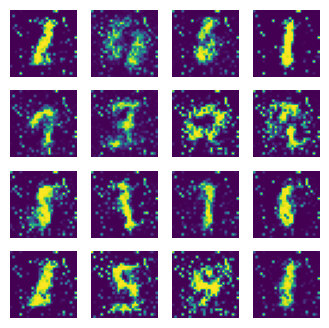

Epoch 33/100, D_loss: 0.1831, G_loss: 6.0222


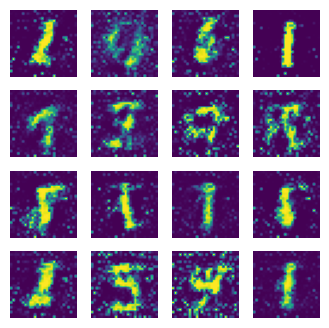

Epoch 34/100, D_loss: 0.3600, G_loss: 3.4845


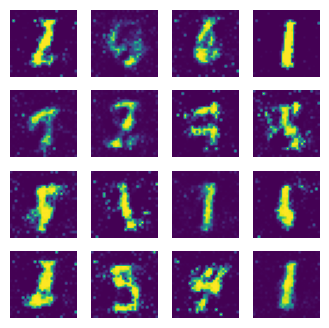

Epoch 35/100, D_loss: 0.4195, G_loss: 2.8568


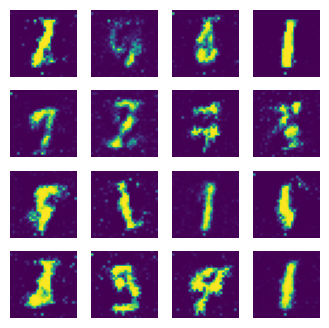

Epoch 36/100, D_loss: 0.4349, G_loss: 2.7735


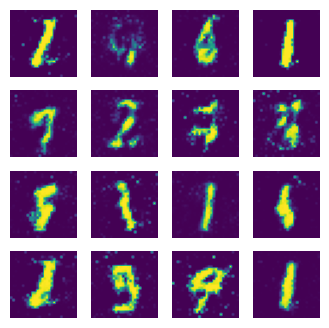

Epoch 37/100, D_loss: 0.4415, G_loss: 2.7030


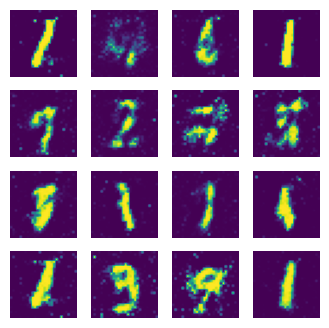

Epoch 38/100, D_loss: 0.4544, G_loss: 2.6596


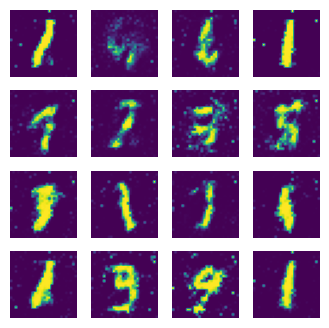

Epoch 39/100, D_loss: 0.4435, G_loss: 2.8085


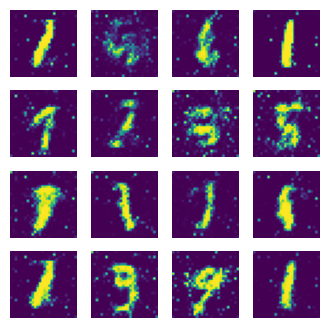

Epoch 40/100, D_loss: 0.2927, G_loss: 4.3486


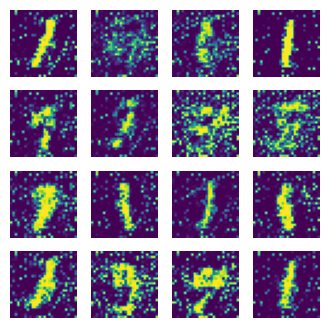

Epoch 41/100, D_loss: 0.2442, G_loss: 5.0620


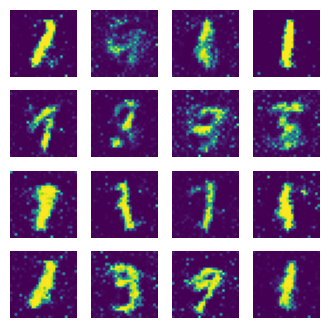

Epoch 42/100, D_loss: 0.4387, G_loss: 2.8065


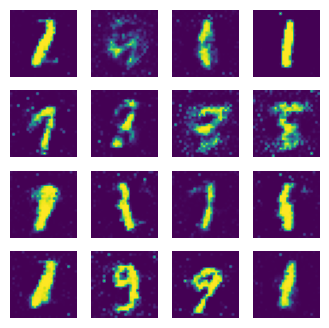

Epoch 43/100, D_loss: 0.4838, G_loss: 2.4785


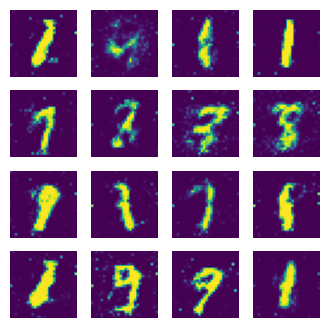

Epoch 44/100, D_loss: 0.4924, G_loss: 2.4250


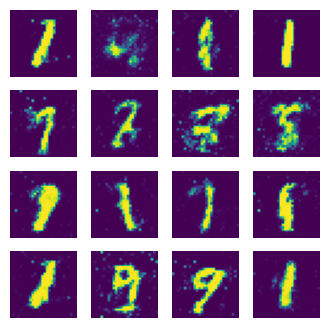

Epoch 45/100, D_loss: 0.4991, G_loss: 2.4270


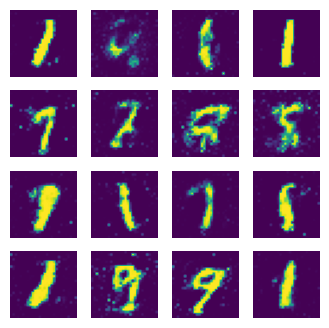

Epoch 46/100, D_loss: 0.5144, G_loss: 2.3750


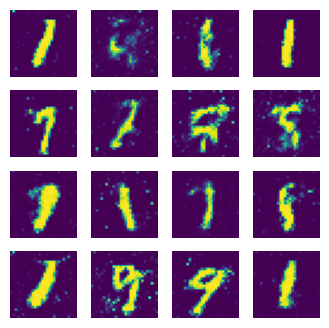

Epoch 47/100, D_loss: 0.5146, G_loss: 2.4435


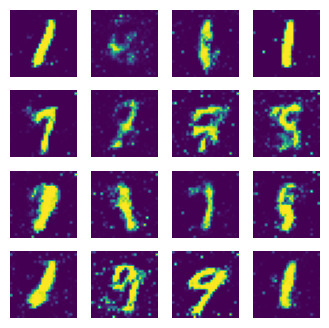

Epoch 48/100, D_loss: 0.4873, G_loss: 2.5871


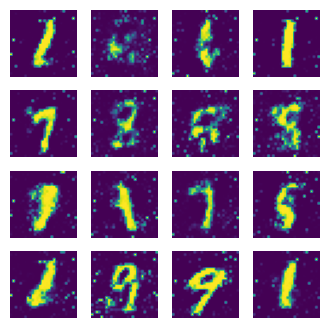

Epoch 49/100, D_loss: 0.4341, G_loss: 2.9173


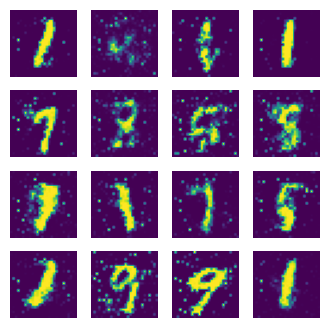

Epoch 50/100, D_loss: 0.2897, G_loss: 4.4309


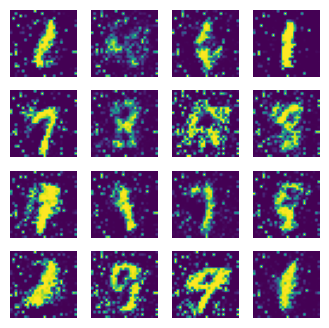

Epoch 51/100, D_loss: 0.2225, G_loss: 5.4623


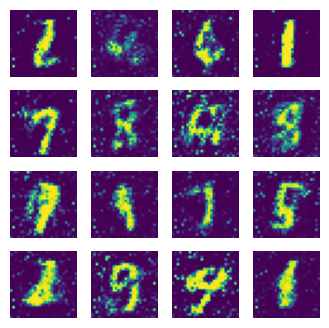

Epoch 52/100, D_loss: 0.4834, G_loss: 2.6350


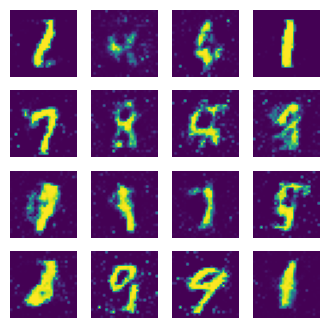

Epoch 53/100, D_loss: 0.5240, G_loss: 2.3442


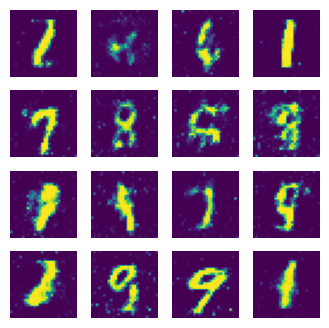

Epoch 54/100, D_loss: 0.5306, G_loss: 2.3362


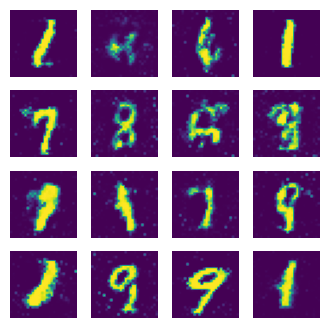

Epoch 55/100, D_loss: 0.5416, G_loss: 2.2957


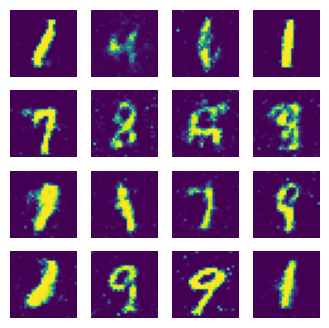

Epoch 56/100, D_loss: 0.5472, G_loss: 2.2424


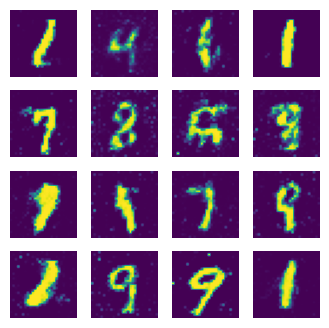

Epoch 57/100, D_loss: 0.5465, G_loss: 2.2667


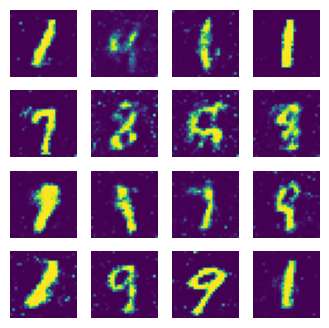

Epoch 58/100, D_loss: 0.5465, G_loss: 2.2852


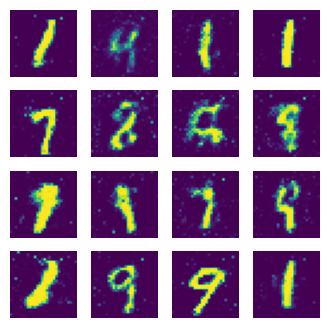

Epoch 59/100, D_loss: 0.5482, G_loss: 2.2704


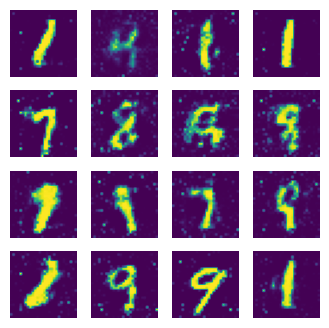

Epoch 60/100, D_loss: 0.5496, G_loss: 2.2843


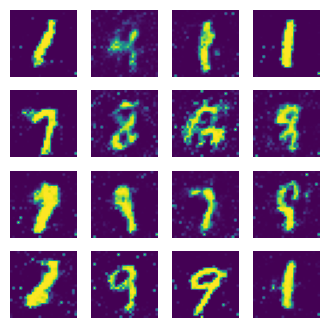

Epoch 61/100, D_loss: 0.5448, G_loss: 2.3235


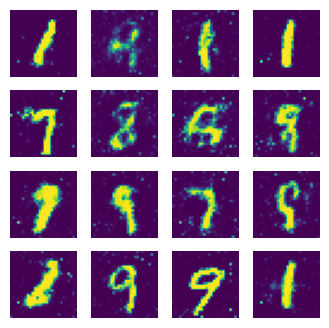

Epoch 62/100, D_loss: 0.5497, G_loss: 2.3229


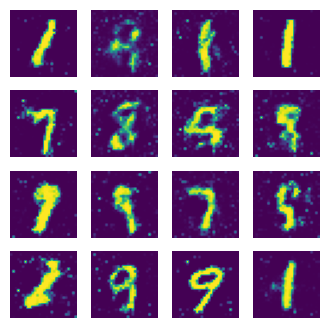

Epoch 63/100, D_loss: 0.5522, G_loss: 2.3091


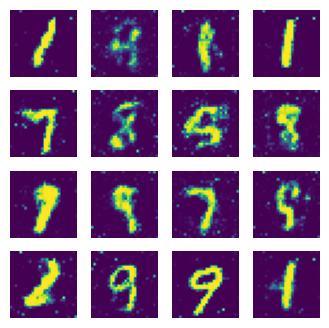

Epoch 64/100, D_loss: 0.5540, G_loss: 2.3086


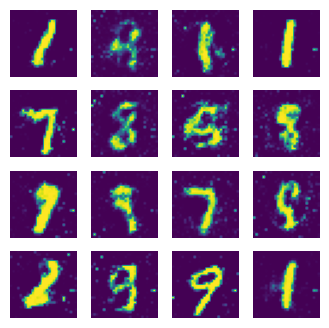

Epoch 65/100, D_loss: 0.5668, G_loss: 2.2211


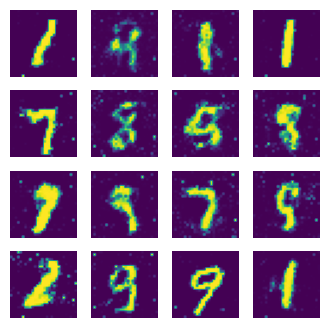

Epoch 66/100, D_loss: 0.5787, G_loss: 2.1832


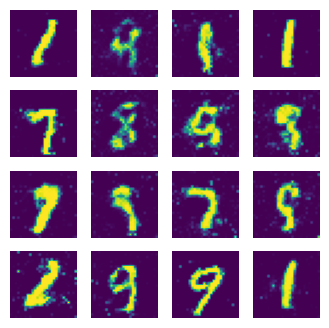

Epoch 67/100, D_loss: 0.5831, G_loss: 2.1834


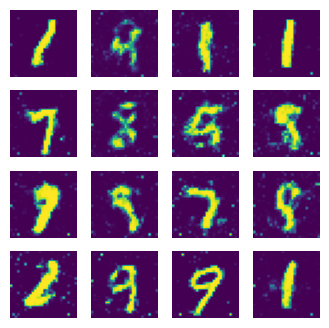

Epoch 68/100, D_loss: 0.5929, G_loss: 2.1244


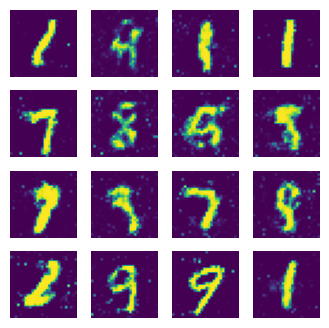

Epoch 69/100, D_loss: 0.5852, G_loss: 2.1203


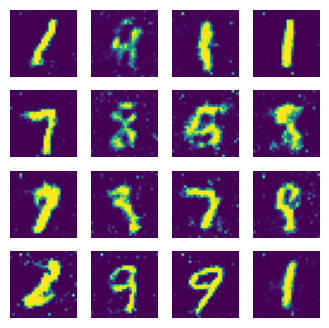

Epoch 70/100, D_loss: 0.5953, G_loss: 2.1216


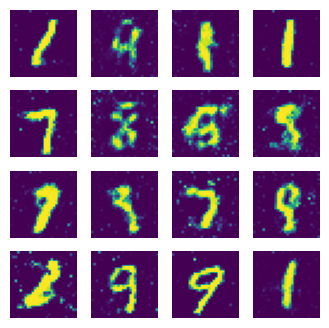

Epoch 71/100, D_loss: 0.6060, G_loss: 2.0669


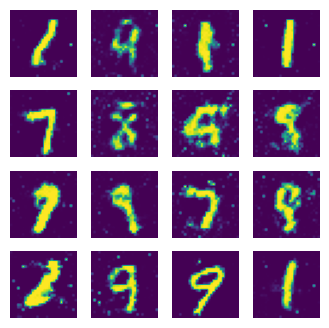

Epoch 72/100, D_loss: 0.6098, G_loss: 2.0543


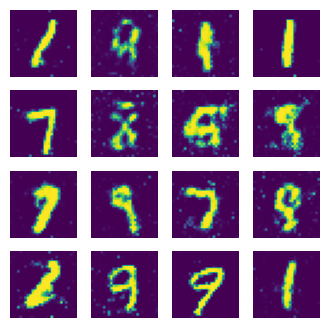

Epoch 73/100, D_loss: 0.6161, G_loss: 2.0506


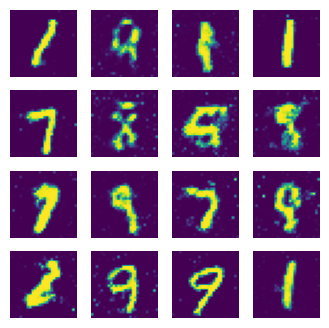

Epoch 74/100, D_loss: 0.6158, G_loss: 2.0487


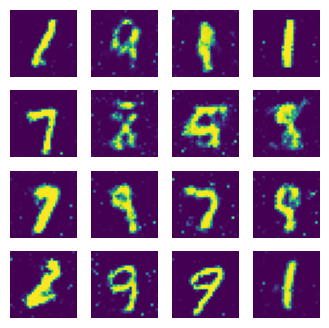

Epoch 75/100, D_loss: 0.6159, G_loss: 2.0198


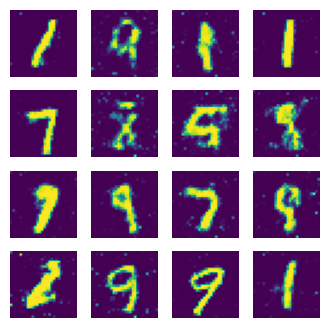

Epoch 76/100, D_loss: 0.6188, G_loss: 2.0193


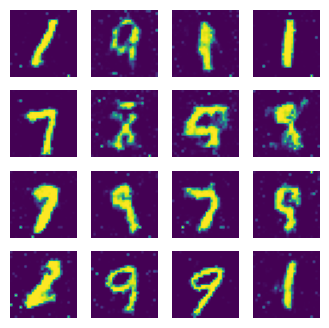

Epoch 77/100, D_loss: 0.6242, G_loss: 2.0084


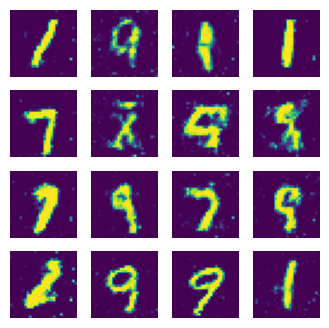

Epoch 78/100, D_loss: 0.6302, G_loss: 1.9774


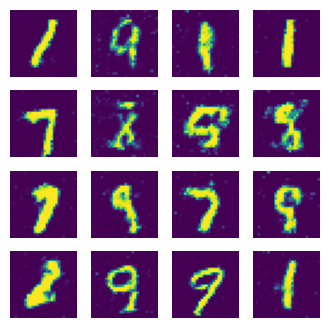

Epoch 79/100, D_loss: 0.6333, G_loss: 1.9847


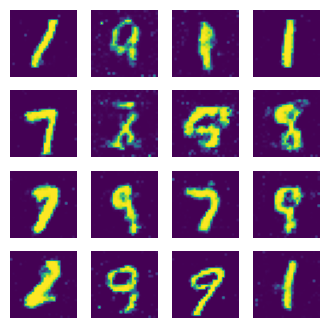

Epoch 80/100, D_loss: 0.6388, G_loss: 1.9585


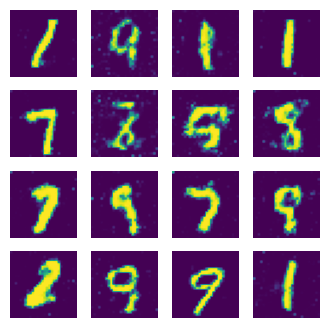

Epoch 81/100, D_loss: 0.6383, G_loss: 1.9580


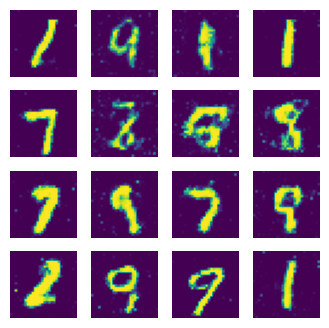

Epoch 82/100, D_loss: 0.6401, G_loss: 1.9648


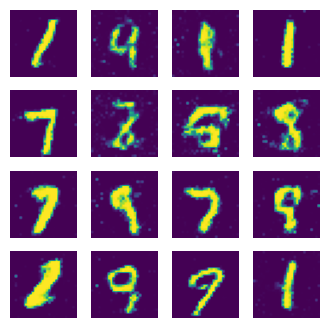

Epoch 83/100, D_loss: 0.6426, G_loss: 1.9664


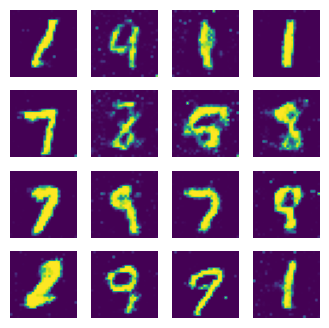

Epoch 84/100, D_loss: 0.6429, G_loss: 1.9439


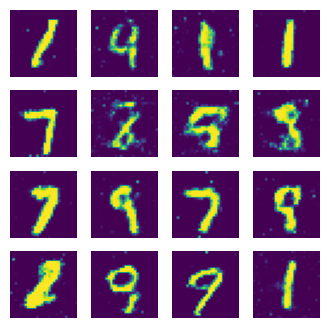

Epoch 85/100, D_loss: 0.6463, G_loss: 1.9304


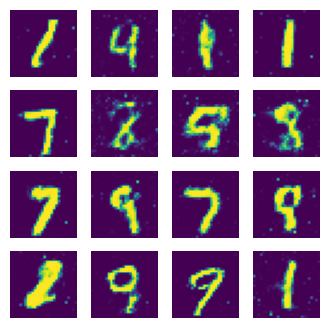

Epoch 86/100, D_loss: 0.6433, G_loss: 1.9356


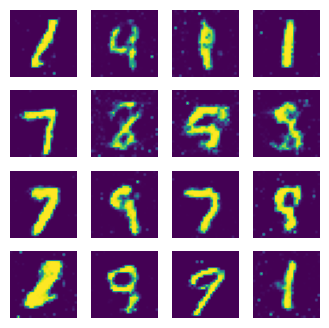

Epoch 87/100, D_loss: 0.6467, G_loss: 1.9286


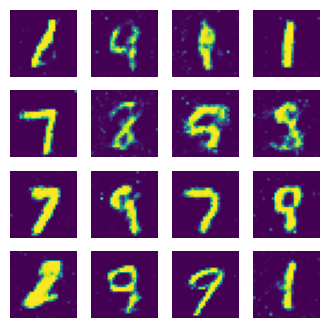

Epoch 88/100, D_loss: 0.6479, G_loss: 1.9267


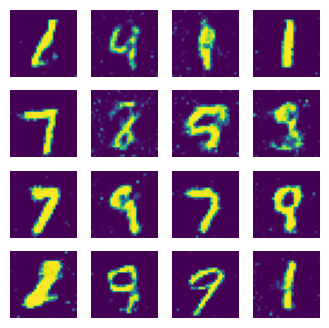

Epoch 89/100, D_loss: 0.6510, G_loss: 1.9210


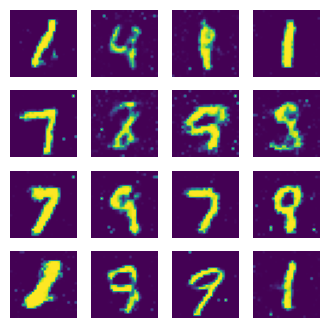

Epoch 90/100, D_loss: 0.6532, G_loss: 1.9259


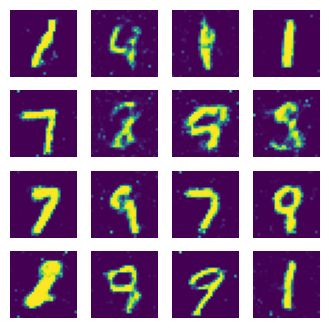

Epoch 91/100, D_loss: 0.6444, G_loss: 1.9292


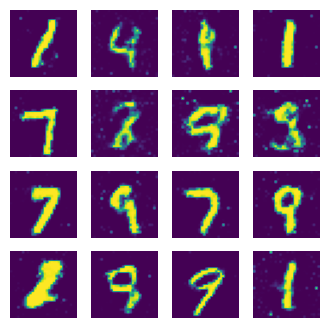

Epoch 92/100, D_loss: 0.6493, G_loss: 1.9243


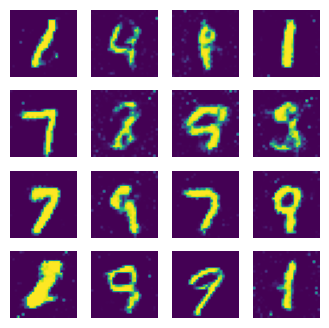

Epoch 93/100, D_loss: 0.6490, G_loss: 1.9073


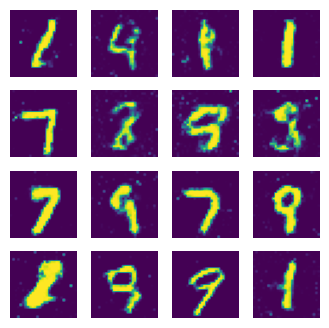

Epoch 94/100, D_loss: 0.6499, G_loss: 1.9036


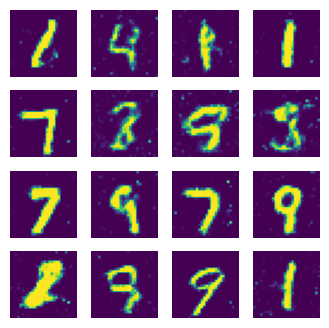

Epoch 95/100, D_loss: 0.6461, G_loss: 1.9243


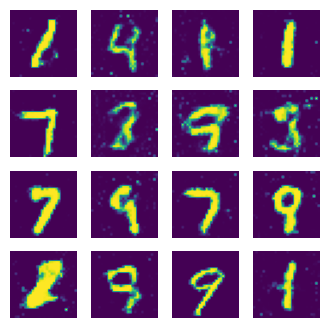

Epoch 96/100, D_loss: 0.6529, G_loss: 1.9000


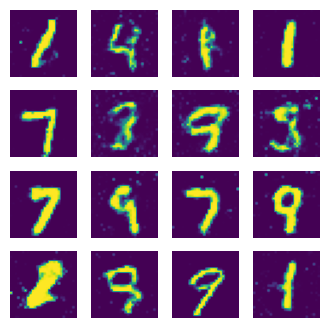

Epoch 97/100, D_loss: 0.6555, G_loss: 1.9136


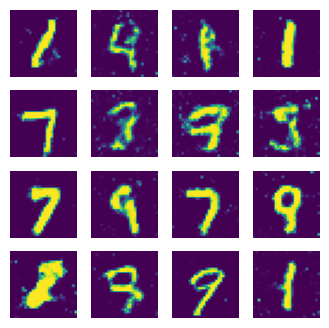

Epoch 98/100, D_loss: 0.6546, G_loss: 1.9037


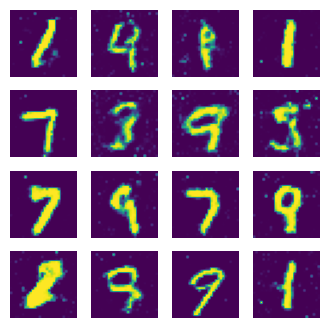

Epoch 99/100, D_loss: 0.6575, G_loss: 1.8909


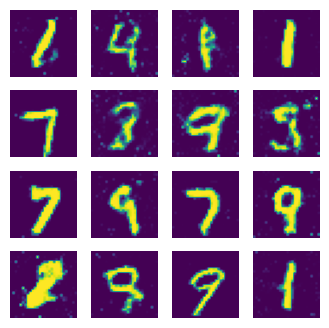

Epoch 100/100, D_loss: 0.6563, G_loss: 1.8819


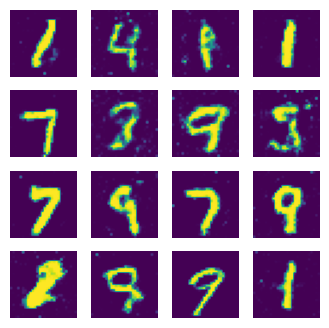

In [14]:
D_losses = []
G_losses = []
epochs = 100
test_input = torch.randn(16, 100, device=device)

for epoch in range(epochs):
    d_epoch_loss = 0
    g_epoch_loss = 0
    count = len(dataloader)     # 返回批次数；len(dataset)会返回样本数
    for i, (image, _) in enumerate(dataloader):
        image = image.to(device)
        size = image.size(0)
        noise = torch.randn(size, 100, device=device)
        
        # 判别器的梯度清零
        optimizer_D.zero_grad()
        # 判别器对真实图片的预测
        real_output = discriminator(image)
        d_real_loss = loss_fn(real_output, torch.ones_like(real_output))
        d_real_loss.backward()
        # 判别器对生成图片的预测
        fake_image = generator(noise)
        fake_output = discriminator(fake_image.detach())
        d_fake_loss = loss_fn(fake_output, torch.zeros_like(fake_output))
        d_fake_loss.backward()
        # 判别器的损失
        d_loss = d_real_loss + d_fake_loss
        optimizer_D.step()
        
        # 生成器的梯度清零
        optimizer_G.zero_grad()
        # 生成器对生成图片的预测
        fake_output = discriminator(fake_image)
        g_loss = loss_fn(fake_output, torch.ones_like(fake_output))
        g_loss.backward()
        optimizer_G.step()
        
        with torch.no_grad():
            d_epoch_loss += d_loss
            g_epoch_loss += g_loss
    with torch.no_grad():
        d_epoch_loss /= count
        g_epoch_loss /= count
        D_losses.append(d_epoch_loss.item())
        G_losses.append(g_epoch_loss.item())
        print(f"Epoch {epoch + 1}/{epochs}, D_loss: {d_epoch_loss.item():.4f}, G_loss: {g_epoch_loss.item():.4f}")
        plot_generator_image(generator, test_input)